# SIAMESE-NETWORK W/ REPLAY-ATTACK TRIPLET LOSS

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
cd /content/drive/MyDrive/BTP/siamese-network-anti-spoofing

/content/drive/MyDrive/BTP/siamese-network-anti-spoofing


In [68]:
import os
import cv2
import zipfile
import random
import numpy as np
from tqdm import tqdm
import tensorflow as tf
from datetime import datetime
from sklearn.utils import shuffle
from tensorflow import keras
import shutil
import dlib
import matplotlib.pyplot as plt
from imutils import face_utils
from os import path
import pandas as pd
from google.colab.patches import cv2_imshow
from tensorflow.keras.applications.resnet50 import ResNet50

%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
    raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [69]:
epochs = 200

optimizer = tf.keras.optimizers.Adam(learning_rate=0.00006)
binary_cross_entropy = tf.keras.losses.BinaryCrossentropy()

# base_dir = "."
base_dir = "/content/drive/MyDrive/BTP/siamese-network-anti-spoofing/lossless-triplet-loss"

stamp = datetime.now().strftime("%Y%m%d-%H%M%S")
logdir = os.path.join(base_dir, 'logs/func/%s' % stamp)
writer = tf.summary.create_file_writer(logdir)

scalar_logdir = os.path.join(base_dir, 'logs/scalars/%s' % stamp)
file_writer = tf.summary.create_file_writer(scalar_logdir + "/metrics")

checkpoint_path = os.path.join(base_dir, 'logs/model/siamese-lossless-triplet-loss-1-1')

In [70]:
'''
The following code cell is taken from the source code of keras_vggface.
I tried using the preprocess_input function provided by tf.keras but they provide different results.
To my knowledge, it seems that the mean values which are subtracted in each image are different.
'''
K = tf.keras.backend

def preprocess_input(x, data_format=None, version=1):
    x_temp = np.copy(x)
    if data_format is None:
        data_format = K.image_data_format()
    assert data_format in {'channels_last', 'channels_first'}

    if version == 1:
        if data_format == 'channels_first':
            x_temp = x_temp[:, ::-1, ...]
            x_temp[:, 0, :, :] -= 93.5940
            x_temp[:, 1, :, :] -= 104.7624
            x_temp[:, 2, :, :] -= 129.1863
        else:
            x_temp = x_temp[..., ::-1]
            x_temp[..., 0] -= 93.5940
            x_temp[..., 1] -= 104.7624
            x_temp[..., 2] -= 129.1863

    elif version == 2:
        if data_format == 'channels_first':
            x_temp = x_temp[:, ::-1, ...]
            x_temp[:, 0, :, :] -= 91.4953
            x_temp[:, 1, :, :] -= 103.8827
            x_temp[:, 2, :, :] -= 131.0912
        else:
            x_temp = x_temp[..., ::-1]
            x_temp[..., 0] -= 91.4953
            x_temp[..., 1] -= 103.8827
            x_temp[..., 2] -= 131.0912
    else:
        raise NotImplementedError

    return x_temp

In [ ]:
# def curate_dataset(dataset_path):
#         with open(os.path.join(dataset_path, 'list.txt'), 'r') as f:
#             dataset = {}
#             image_list = f.read().split()
#             print('Total images: ',len(image_list))
#             for image in image_list:
#                 folder_name, class_type ,file_name = image.split('/')
#                 if folder_name in dataset.keys():
#                   if class_type in dataset[folder_name].keys():
#                     dataset[folder_name][class_type].append(file_name)
#                   else:
#                     dataset[folder_name][class_type] = [file_name]
#                 else:
#                     dataset[folder_name] = {class_type: [file_name]}
#         return dataset

# dataset = curate_dataset('./dataset/train')
# print(dataset.keys()) 
# print(len(dataset['client016']['spoof']))
# print(len(dataset['client016']['real']))

Total images:  91705
dict_keys(['client016', 'client025', 'client108', 'client006', 'client027', 'client103', 'client004', 'client008', 'client018', 'client007', 'client012', 'client110', 'client002', 'client001', 'client105'])
4538
1500


In [71]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, dataset_path, batch_size=32, shuffle=True):
        self.dataset = self.curate_dataset(dataset_path)
        self.dataset_path = dataset_path
        self.shuffle = shuffle
        self.batch_size =batch_size
        self.no_of_people = len(list(self.dataset.keys()))
        self.on_epoch_end()
        
    def __getitem__(self, index):
        people = list(self.dataset.keys())[index * self.batch_size: (index + 1) * self.batch_size]
        P = []
        A = []
        N = []
        
        for person in people:
            anchor_index = random.randint(0, len(self.dataset[person]['real'])-1)
            a = self.get_image(person, 'real' ,anchor_index)
            
            positive_index = random.randint(0, len(self.dataset[person]['real'])-1)
            while positive_index == anchor_index:
                positive_index = random.randint(0, len(self.dataset[person]['real'])-1)
            p = self.get_image(person, 'real' ,positive_index)
            
            negative_index = random.randint(0, len(self.dataset[person]['spoof'])-1)
            n = self.get_image(person, 'spoof',negative_index)
            
            P.append(p)
            A.append(a)
            N.append(n)
            
        A = np.asarray(A)
        N = np.asarray(N)
        P = np.asarray(P)
        return [A, P, N]
        
    def __len__(self):
        return self.no_of_people // self.batch_size
        
    def curate_dataset(self,dataset_path):
        with open(os.path.join(dataset_path, 'list.txt'), 'r') as f:
            dataset = {}
            image_list = f.read().split()
            print('Total images: ',len(image_list))
            for image in image_list:
                folder_name, class_type ,file_name = image.split('/')
                if folder_name in dataset.keys():
                  if class_type in dataset[folder_name].keys():
                    dataset[folder_name][class_type].append(file_name)
                  else:
                    dataset[folder_name][class_type] = [file_name]
                else:
                    dataset[folder_name] = {class_type: [file_name]}
        return dataset
    
    def on_epoch_end(self):
        if self.shuffle:
            keys = list(self.dataset.keys())
            random.shuffle(keys)
            dataset_ =  {}
            for key in keys:
                dataset_[key] = self.dataset[key]
            self.dataset = dataset_
            
    def get_image(self, person, class_type, index):
        # print(os.path.join(self.dataset_path, os.path.join('images/' + person+f'/{class_type}', self.dataset[person][class_type][index])))
        img = cv2.imread(os.path.join(self.dataset_path, os.path.join('images/' + person+f'/{class_type}', self.dataset[person][class_type][index])))
        img = cv2.resize(img, (256, 256))
        img = np.asarray(img, dtype=np.float64)
        img = preprocess_input(img)
        return img

In [ ]:
# index = 4
# cv2.imshow("Positive", p[index])
# cv2.imshow("Negative", n[index])
# cv2.imshow("Anchor", a[index])
# cv2.waitKey(0)
# cv2.destroyAllWindows()

In [72]:
vggface = tf.keras.models.Sequential()
vggface.add(tf.keras.layers.Convolution2D(64, (3, 3), activation='relu', padding="SAME", input_shape=(256,256, 3)))
vggface.add(tf.keras.layers.Convolution2D(64, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.MaxPooling2D((2,2), strides=(2,2)))
 
vggface.add(tf.keras.layers.Convolution2D(128, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(128, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.MaxPooling2D((2,2), strides=(2,2)))
 
vggface.add(tf.keras.layers.Convolution2D(256, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(256, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(256, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.MaxPooling2D((2,2), strides=(2,2)))
 
vggface.add(tf.keras.layers.Convolution2D(512, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(512, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(512, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.MaxPooling2D((2,2), strides=(2,2)))
 
vggface.add(tf.keras.layers.Convolution2D(512, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(512, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(512, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.MaxPooling2D((2,2), strides=(2,2)))

vggface.add(tf.keras.layers.Flatten())

vggface.add(tf.keras.layers.Dense(4096, activation='relu'))
vggface.add(tf.keras.layers.Dropout(0.5))
vggface.add(tf.keras.layers.Dense(4096, activation='relu'))
vggface.add(tf.keras.layers.Dropout(0.5))
vggface.add(tf.keras.layers.Dense(2622, activation='softmax'))

In [ ]:
vggface.load_weights(os.path.join(base_dir, 'vgg_face_weights.h5'))

In [73]:
vggface.pop()
vggface.add(tf.keras.layers.Dense(128, use_bias=False,activation='sigmoid'))

for layer in vggface.layers[:-2]:
    layer.trainable = False

In [74]:
class SiameseNetwork(tf.keras.Model):
    def __init__(self, vgg_face):
        super(SiameseNetwork, self).__init__()
        self.vgg_face = vgg_face
        
    @tf.function
    def call(self, inputs):
        image_1, image_2, image_3 =  inputs
        with tf.name_scope("Anchor") as scope:
            feature_1 = self.vgg_face(image_1)
            feature_1 = tf.math.l2_normalize(feature_1, axis=-1)
        with tf.name_scope("Positive") as scope:
            feature_2 = self.vgg_face(image_2)
            feature_2 = tf.math.l2_normalize(feature_2, axis=-1)
        with tf.name_scope("Negative") as scope:
            feature_3 = self.vgg_face(image_3)
            feature_3 = tf.math.l2_normalize(feature_3, axis=-1)
        return [feature_1, feature_2, feature_3]
    
    @tf.function
    def get_features(self, inputs):
        return tf.math.l2_normalize(self.vgg_face(inputs), axis=-1)

In [75]:
model = SiameseNetwork(vggface)

In [76]:
def lossless_triplet_loss(y_true, y_pred, N = 3, beta=3, epsilon=1e-8):
    """
    Implementation of the triplet loss function
    
    Arguments:
    y_true -- true labels, required when you define a loss in Keras, you don't need it in this function.
    y_pred -- python list containing three objects:
            anchor -- the encodings for the anchor data
            positive -- the encodings for the positive data (similar to anchor)
            negative -- the encodings for the negative data (different from anchor)
    N  --  The number of dimension 
    beta -- The scaling factor, N is recommended
    epsilon -- The Epsilon value to prevent ln(0)
    
    
    Returns:
    loss -- real number, value of the loss
    """
    # anchor = tf.convert_to_tensor(y_pred[:,0:N])
    # positive = tf.convert_to_tensor(y_pred[:,N:N*2]) 
    # negative = tf.convert_to_tensor(y_pred[:,N*2:N*3])

    anchor,positive,negative = y_pred
    
    # distance between the anchor and the positive
    pos_dist = tf.reduce_sum(tf.square(tf.subtract(anchor,positive)),1)
    # distance between the anchor and the negative
    neg_dist = tf.reduce_sum(tf.square(tf.subtract(anchor,negative)),1)
    
    #Non Linear Values  
    
    # -ln(-x/N+1)
    pos_dist = -tf.math.log(-tf.divide((pos_dist),beta)+1+epsilon)
    neg_dist = -tf.math.log(-tf.divide((N-neg_dist),beta)+1+epsilon)
    
    # compute loss
    loss = neg_dist + pos_dist
    
    return loss

In [77]:
def train(X):
    with tf.GradientTape() as tape:
        y_pred = model(X)
        loss = lossless_triplet_loss(None,y_pred)
    grad = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grad, model.trainable_variables))
    return loss

In [78]:
tf.summary.trace_on(graph=True, profiler=False)
output = model([tf.zeros((32,256,256,3)), tf.zeros((32,256,256,3)), tf.zeros((32,256,256,3))])
with writer.as_default():
    tf.summary.trace_export(name="my_func_trace", step=0, profiler_outdir=logdir)
    
tf.summary.trace_off()

In [79]:
data_generator = DataGenerator(dataset_path='./dataset/train', batch_size=1)

Total images:  91705


In [ ]:
data_generator.get_image('client001','real',0)

array([[[  28.406 ,   26.2376,  -10.1863],
        [  28.406 ,   26.2376,   -9.1863],
        [  27.406 ,   26.2376,   -6.1863],
        ...,
        [ -88.594 , -101.7624, -124.1863],
        [ -85.594 , -104.7624, -127.1863],
        [ -84.594 , -104.7624, -128.1863]],

       [[  29.406 ,   27.2376,  -10.1863],
        [  29.406 ,   27.2376,   -9.1863],
        [  28.406 ,   27.2376,   -6.1863],
        ...,
        [ -88.594 , -100.7624, -124.1863],
        [ -85.594 , -103.7624, -127.1863],
        [ -84.594 , -104.7624, -128.1863]],

       [[  32.406 ,   31.2376,  -11.1863],
        [  32.406 ,   31.2376,  -10.1863],
        [  32.406 ,   31.2376,   -6.1863],
        ...,
        [ -87.594 ,  -99.7624, -121.1863],
        [ -86.594 , -102.7624, -126.1863],
        [ -86.594 , -103.7624, -128.1863]],

       ...,

       [[  27.406 ,   -5.7624,  -28.1863],
        [  27.406 ,   -5.7624,  -28.1863],
        [  27.406 ,   -5.7624,  -29.1863],
        ...,
        [ -92.594 , -104.7

In [ ]:
# data_curated = data_generator.curate_dataset(dataset_path='./dataset/train')
# print(len(data_curated['n000009']))

In [ ]:
print(data_generator[14])

[array([[[[  -6.594 ,  -21.7624,  -44.1863],
         [  -7.594 ,  -23.7624,  -46.1863],
         [ -10.594 ,  -27.7624,  -50.1863],
         ...,
         [ -27.594 ,  -36.7624,  -54.1863],
         [ -27.594 ,  -36.7624,  -55.1863],
         [ -27.594 ,  -36.7624,  -55.1863]],

        [[  -7.594 ,  -22.7624,  -44.1863],
         [  -8.594 ,  -23.7624,  -46.1863],
         [  -9.594 ,  -26.7624,  -50.1863],
         ...,
         [ -26.594 ,  -35.7624,  -54.1863],
         [ -28.594 ,  -37.7624,  -55.1863],
         [ -28.594 ,  -37.7624,  -56.1863]],

        [[  -9.594 ,  -23.7624,  -44.1863],
         [  -8.594 ,  -24.7624,  -46.1863],
         [  -7.594 ,  -25.7624,  -49.1863],
         ...,
         [ -26.594 ,  -35.7624,  -52.1863],
         [ -29.594 ,  -38.7624,  -56.1863],
         [ -31.594 ,  -40.7624,  -57.1863]],

        ...,

        [[ -30.594 ,  -33.7624,  -42.1863],
         [ -30.594 ,  -32.7624,  -41.1863],
         [ -30.594 ,  -30.7624,  -40.1863],
         ...,

In [80]:
a, p, n = data_generator[0]

In [ ]:
# index = 1
# cv2.imshow("Positive", p[index])
# cv2.imshow("Negative", n[index])
# cv2.imshow("Anchor", a[index])
# cv2.waitKey(0)
# cv2.destroyAllWindows()

In [ ]:
# %tensorboard --logdir /content/drive/My\ Drive/siamese-network-anti-spoofing/lossless-triplet-loss/logs/
%tensorboard --logdir ./logs/

<IPython.core.display.Javascript object>

In [81]:
checkpoint = tf.train.Checkpoint(model=model)

In [ ]:
losses = []
accuracy = []

no_of_batches = data_generator.__len__()
for i in range(1, epochs+1, 1):
    loss = 0
    with tqdm(total=no_of_batches) as pbar:
        
        description = "Epoch " + str(i) + "/" + str(epochs)
        pbar.set_description_str(description)
        
        for j in range(no_of_batches):
            data = data_generator[j]
            temp = train(data)
            loss += temp
            
            pbar.update()
            print_statement = "Loss :" + str(temp.numpy()[0])
            pbar.set_postfix_str(print_statement)
        
        loss /= no_of_batches
        losses.append(loss.numpy())
        with file_writer.as_default():
            tf.summary.scalar('Loss', data=loss.numpy()[0], step=i)
            
        print_statement = "Loss :" + str(loss.numpy()[0])
        
        pbar.set_postfix_str(print_statement)

checkpoint.save(checkpoint_path)
print("Checkpoint Saved")

Epoch 200/200: 100%|██████████| 15/15 [00:12<00:00,  1.24it/s, Loss :1.2615563]


Checkpoint Saved


In [82]:
temp = ['Epoch 1/200: 100%|██████████| 15/15 [04:39<00:00, 18.67s/it, Loss :8.051397]',
'Epoch 2/200: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it, Loss :7.5643444]',
'Epoch 3/200: 100%|██████████| 15/15 [00:16<00:00,  1.09s/it, Loss :7.611496]',
'Epoch 4/200: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it, Loss :7.389288]',
'Epoch 5/200: 100%|██████████| 15/15 [00:15<00:00,  1.04s/it, Loss :6.832321]',
'Epoch 6/200: 100%|██████████| 15/15 [00:16<00:00,  1.09s/it, Loss :7.0849776]',
'Epoch 7/200: 100%|██████████| 15/15 [00:16<00:00,  1.08s/it, Loss :6.38244]',
'Epoch 8/200: 100%|██████████| 15/15 [00:15<00:00,  1.06s/it, Loss :6.4735126]',
'Epoch 9/200: 100%|██████████| 15/15 [00:15<00:00,  1.06s/it, Loss :6.6350403]',
'Epoch 10/200: 100%|██████████| 15/15 [00:15<00:00,  1.04s/it, Loss :6.096589]',
'Epoch 11/200: 100%|██████████| 15/15 [00:15<00:00,  1.04s/it, Loss :6.629474]',
'Epoch 12/200: 100%|██████████| 15/15 [00:15<00:00,  1.01s/it, Loss :5.883583]',
'Epoch 13/200: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it, Loss :6.027596]',
'Epoch 14/200: 100%|██████████| 15/15 [00:15<00:00,  1.04s/it, Loss :5.8267045]',
'Epoch 15/200: 100%|██████████| 15/15 [00:15<00:00,  1.06s/it, Loss :6.4633517]',
'Epoch 16/200: 100%|██████████| 15/15 [00:15<00:00,  1.04s/it, Loss :5.848902]',
'Epoch 17/200: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it, Loss :6.0124846]',
'Epoch 18/200: 100%|██████████| 15/15 [00:15<00:00,  1.02s/it, Loss :5.6662273]',
'Epoch 19/200: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it, Loss :5.0653143]',
'Epoch 20/200: 100%|██████████| 15/15 [00:15<00:00,  1.04s/it, Loss :5.219136]',
'Epoch 21/200: 100%|██████████| 15/15 [00:15<00:00,  1.05s/it, Loss :4.9730587]',
'Epoch 22/200: 100%|██████████| 15/15 [00:15<00:00,  1.04s/it, Loss :5.0900083]',
'Epoch 23/200: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it, Loss :4.978363]',
'Epoch 24/200: 100%|██████████| 15/15 [00:15<00:00,  1.01s/it, Loss :4.9822617]',
'Epoch 25/200: 100%|██████████| 15/15 [00:15<00:00,  1.05s/it, Loss :4.6748486]',
'Epoch 26/200: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it, Loss :5.08732]',
'Epoch 27/200: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it, Loss :4.8637705]',
'Epoch 28/200: 100%|██████████| 15/15 [00:14<00:00,  1.01it/s, Loss :4.7260265]',
'Epoch 29/200: 100%|██████████| 15/15 [00:15<00:00,  1.00s/it, Loss :4.666048]',
'Epoch 30/200: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it, Loss :4.8662395]',
'Epoch 31/200: 100%|██████████| 15/15 [00:14<00:00,  1.03it/s, Loss :4.498535]',
'Epoch 32/200: 100%|██████████| 15/15 [00:16<00:00,  1.07s/it, Loss :4.5762935]',
'Epoch 33/200: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it, Loss :4.127112]',
'Epoch 34/200: 100%|██████████| 15/15 [00:15<00:00,  1.06s/it, Loss :4.484622]',
'Epoch 35/200: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s, Loss :4.107627]',
'Epoch 36/200: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s, Loss :4.7710986]',
'Epoch 37/200: 100%|██████████| 15/15 [00:14<00:00,  1.01it/s, Loss :4.007619]',
'Epoch 38/200: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s, Loss :3.9188352]',
'Epoch 39/200: 100%|██████████| 15/15 [00:14<00:00,  1.03it/s, Loss :4.073506]',
'Epoch 40/200: 100%|██████████| 15/15 [00:15<00:00,  1.05s/it, Loss :3.68043]',
'Epoch 41/200: 100%|██████████| 15/15 [00:15<00:00,  1.01s/it, Loss :4.0797567]',
'Epoch 42/200: 100%|██████████| 15/15 [00:14<00:00,  1.01it/s, Loss :3.7817798]',
'Epoch 43/200: 100%|██████████| 15/15 [00:14<00:00,  1.04it/s, Loss :3.94938]',
'Epoch 44/200: 100%|██████████| 15/15 [00:16<00:00,  1.07s/it, Loss :3.954335]',
'Epoch 45/200: 100%|██████████| 15/15 [00:14<00:00,  1.03it/s, Loss :3.466643]',
'Epoch 46/200: 100%|██████████| 15/15 [00:15<00:00,  1.06s/it, Loss :3.5853467]',
'Epoch 47/200: 100%|██████████| 15/15 [00:15<00:00,  1.06s/it, Loss :3.5866215]',
'Epoch 48/200: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it, Loss :4.132548]',
'Epoch 49/200: 100%|██████████| 15/15 [00:15<00:00,  1.06s/it, Loss :3.8659704]',
'Epoch 50/200: 100%|██████████| 15/15 [00:15<00:00,  1.02s/it, Loss :3.429017]',
'Epoch 51/200: 100%|██████████| 15/15 [00:15<00:00,  1.05s/it, Loss :3.3160734]',
'Epoch 52/200: 100%|██████████| 15/15 [00:15<00:00,  1.04s/it, Loss :3.3444638]',
'Epoch 53/200: 100%|██████████| 15/15 [00:15<00:00,  1.01s/it, Loss :3.1033254]',
'Epoch 54/200: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it, Loss :3.3047402]',
'Epoch 55/200: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s, Loss :3.2921646]',
'Epoch 56/200: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it, Loss :3.0922978]',
'Epoch 57/200: 100%|██████████| 15/15 [00:15<00:00,  1.06s/it, Loss :3.3124347]',
'Epoch 58/200: 100%|██████████| 15/15 [00:14<00:00,  1.01it/s, Loss :3.1075287]',
'Epoch 59/200: 100%|██████████| 15/15 [00:15<00:00,  1.01s/it, Loss :3.0996776]',
'Epoch 60/200: 100%|██████████| 15/15 [00:15<00:00,  1.04s/it, Loss :3.026015]',
'Epoch 61/200: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s, Loss :2.990257]',
'Epoch 62/200: 100%|██████████| 15/15 [00:15<00:00,  1.05s/it, Loss :3.264026]',
'Epoch 63/200: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it, Loss :2.9962273]',
'Epoch 64/200: 100%|██████████| 15/15 [00:15<00:00,  1.02s/it, Loss :2.6684918]',
'Epoch 65/200: 100%|██████████| 15/15 [00:15<00:00,  1.01s/it, Loss :3.0772552]',
'Epoch 66/200: 100%|██████████| 15/15 [00:16<00:00,  1.13s/it, Loss :2.702938]',
'Epoch 67/200: 100%|██████████| 15/15 [00:14<00:00,  1.01it/s, Loss :2.6131551]',
'Epoch 68/200: 100%|██████████| 15/15 [00:15<00:00,  1.02s/it, Loss :2.8566537]',
'Epoch 69/200: 100%|██████████| 15/15 [00:14<00:00,  1.07it/s, Loss :2.6503084]',
'Epoch 70/200: 100%|██████████| 15/15 [00:12<00:00,  1.18it/s, Loss :2.525425]',
'Epoch 71/200: 100%|██████████| 15/15 [00:15<00:00,  1.00s/it, Loss :2.598873]',
'Epoch 72/200: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s, Loss :2.25734]',
'Epoch 73/200: 100%|██████████| 15/15 [00:15<00:00,  1.01s/it, Loss :2.8628385]',
'Epoch 74/200: 100%|██████████| 15/15 [00:16<00:00,  1.11s/it, Loss :2.5048718]',
'Epoch 75/200: 100%|██████████| 15/15 [00:15<00:00,  1.04s/it, Loss :2.4203758]',
'Epoch 76/200: 100%|██████████| 15/15 [00:14<00:00,  1.00it/s, Loss :2.4978273]',
'Epoch 77/200: 100%|██████████| 15/15 [00:14<00:00,  1.01it/s, Loss :2.600295]',
'Epoch 78/200: 100%|██████████| 15/15 [00:16<00:00,  1.09s/it, Loss :2.1780443]',
'Epoch 79/200: 100%|██████████| 15/15 [00:16<00:00,  1.08s/it, Loss :2.444838]',
'Epoch 80/200: 100%|██████████| 15/15 [00:15<00:00,  1.01s/it, Loss :2.3540168]',
'Epoch 81/200: 100%|██████████| 15/15 [00:15<00:00,  1.06s/it, Loss :2.2983553]',
'Epoch 82/200: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it, Loss :2.5084229]',
'Epoch 83/200: 100%|██████████| 15/15 [00:13<00:00,  1.08it/s, Loss :2.3419833]',
'Epoch 84/200: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it, Loss :2.0962472]',
'Epoch 85/200: 100%|██████████| 15/15 [00:14<00:00,  1.01it/s, Loss :2.3587255]',
'Epoch 86/200: 100%|██████████| 15/15 [00:16<00:00,  1.08s/it, Loss :2.3909457]',
'Epoch 87/200: 100%|██████████| 15/15 [00:15<00:00,  1.02s/it, Loss :2.0133805]',
'Epoch 88/200: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it, Loss :1.9364183]',
'Epoch 89/200: 100%|██████████| 15/15 [00:13<00:00,  1.11it/s, Loss :2.3069763]',
'Epoch 90/200: 100%|██████████| 15/15 [00:15<00:00,  1.06s/it, Loss :2.4452722]',
'Epoch 91/200: 100%|██████████| 15/15 [00:13<00:00,  1.11it/s, Loss :2.2223845]',
'Epoch 92/200: 100%|██████████| 15/15 [00:14<00:00,  1.04it/s, Loss :2.1187418]',
'Epoch 93/200: 100%|██████████| 15/15 [00:13<00:00,  1.08it/s, Loss :2.0667002]',
'Epoch 94/200: 100%|██████████| 15/15 [00:14<00:00,  1.01it/s, Loss :2.0845072]',
'Epoch 95/200: 100%|██████████| 15/15 [00:14<00:00,  1.00it/s, Loss :1.9936423]',
'Epoch 96/200: 100%|██████████| 15/15 [00:15<00:00,  1.00s/it, Loss :2.004241]',
'Epoch 97/200: 100%|██████████| 15/15 [00:13<00:00,  1.12it/s, Loss :1.9445392]',
'Epoch 98/200: 100%|██████████| 15/15 [00:14<00:00,  1.03it/s, Loss :1.9126201]',
'Epoch 99/200: 100%|██████████| 15/15 [00:14<00:00,  1.01it/s, Loss :2.0981815]',
'Epoch 100/200: 100%|██████████| 15/15 [00:14<00:00,  1.06it/s, Loss :1.8137511]',
'Epoch 101/200: 100%|██████████| 15/15 [00:13<00:00,  1.11it/s, Loss :1.9652102]',
'Epoch 102/200: 100%|██████████| 15/15 [00:15<00:00,  1.01s/it, Loss :1.8009051]',
'Epoch 103/200: 100%|██████████| 15/15 [00:15<00:00,  1.01s/it, Loss :2.0554423]',
'Epoch 104/200: 100%|██████████| 15/15 [00:14<00:00,  1.05it/s, Loss :1.7994492]',
'Epoch 105/200: 100%|██████████| 15/15 [00:14<00:00,  1.07it/s, Loss :2.1414855]',
'Epoch 106/200: 100%|██████████| 15/15 [00:13<00:00,  1.08it/s, Loss :1.920953]',
'Epoch 107/200: 100%|██████████| 15/15 [00:14<00:00,  1.00it/s, Loss :1.772942]',
'Epoch 108/200: 100%|██████████| 15/15 [00:14<00:00,  1.03it/s, Loss :1.8913902]',
'Epoch 109/200: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s, Loss :1.7879424]',
'Epoch 110/200: 100%|██████████| 15/15 [00:14<00:00,  1.06it/s, Loss :2.0102425]',
'Epoch 111/200: 100%|██████████| 15/15 [00:13<00:00,  1.12it/s, Loss :2.0101368]',
'Epoch 112/200: 100%|██████████| 15/15 [00:14<00:00,  1.03it/s, Loss :2.0741618]',
'Epoch 113/200: 100%|██████████| 15/15 [00:13<00:00,  1.07it/s, Loss :2.4324431]',
'Epoch 114/200: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it, Loss :2.1658635]',
'Epoch 115/200: 100%|██████████| 15/15 [00:14<00:00,  1.07it/s, Loss :1.9578383]',
'Epoch 116/200: 100%|██████████| 15/15 [00:13<00:00,  1.10it/s, Loss :1.635195]',
'Epoch 117/200: 100%|██████████| 15/15 [00:13<00:00,  1.10it/s, Loss :1.7646161]',
'Epoch 118/200: 100%|██████████| 15/15 [00:14<00:00,  1.05it/s, Loss :1.7721642]',
'Epoch 119/200: 100%|██████████| 15/15 [00:13<00:00,  1.10it/s, Loss :2.1178863]',
'Epoch 120/200: 100%|██████████| 15/15 [00:14<00:00,  1.01it/s, Loss :1.3873345]',
'Epoch 121/200: 100%|██████████| 15/15 [00:13<00:00,  1.12it/s, Loss :1.41388]',
'Epoch 122/200: 100%|██████████| 15/15 [00:13<00:00,  1.09it/s, Loss :1.7359954]',
'Epoch 123/200: 100%|██████████| 15/15 [00:12<00:00,  1.20it/s, Loss :2.1455727]',
'Epoch 124/200: 100%|██████████| 15/15 [00:12<00:00,  1.20it/s, Loss :1.4312109]',
'Epoch 125/200: 100%|██████████| 15/15 [00:13<00:00,  1.15it/s, Loss :1.7317121]',
'Epoch 126/200: 100%|██████████| 15/15 [00:15<00:00,  1.05s/it, Loss :1.6003612]',
'Epoch 127/200: 100%|██████████| 15/15 [00:13<00:00,  1.11it/s, Loss :2.0978405]',
'Epoch 128/200: 100%|██████████| 15/15 [00:13<00:00,  1.10it/s, Loss :1.426405]',
'Epoch 129/200: 100%|██████████| 15/15 [00:14<00:00,  1.06it/s, Loss :1.7157342]',
'Epoch 130/200: 100%|██████████| 15/15 [00:13<00:00,  1.14it/s, Loss :1.8257463]',
'Epoch 131/200: 100%|██████████| 15/15 [00:13<00:00,  1.08it/s, Loss :1.7648274]',
'Epoch 132/200: 100%|██████████| 15/15 [00:13<00:00,  1.08it/s, Loss :1.8728477]',
'Epoch 133/200: 100%|██████████| 15/15 [00:13<00:00,  1.08it/s, Loss :1.8834565]',
'Epoch 134/200: 100%|██████████| 15/15 [00:14<00:00,  1.01it/s, Loss :1.528869]',
'Epoch 135/200: 100%|██████████| 15/15 [00:14<00:00,  1.03it/s, Loss :1.7172866]',
'Epoch 136/200: 100%|██████████| 15/15 [00:13<00:00,  1.12it/s, Loss :1.3106681]',
'Epoch 137/200: 100%|██████████| 15/15 [00:14<00:00,  1.05it/s, Loss :1.8685185]',
'Epoch 138/200: 100%|██████████| 15/15 [00:14<00:00,  1.06it/s, Loss :1.9693395]',
'Epoch 139/200: 100%|██████████| 15/15 [00:12<00:00,  1.22it/s, Loss :1.6819388]',
'Epoch 140/200: 100%|██████████| 15/15 [00:13<00:00,  1.12it/s, Loss :1.6203742]',
'Epoch 141/200: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s, Loss :1.7402728]',
'Epoch 142/200: 100%|██████████| 15/15 [00:12<00:00,  1.19it/s, Loss :1.3935832]',
'Epoch 143/200: 100%|██████████| 15/15 [00:12<00:00,  1.22it/s, Loss :1.2920926]',
'Epoch 144/200: 100%|██████████| 15/15 [00:14<00:00,  1.07it/s, Loss :1.4070549]',
'Epoch 145/200: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s, Loss :1.3148301]',
'Epoch 146/200: 100%|██████████| 15/15 [00:12<00:00,  1.21it/s, Loss :1.8270887]',
'Epoch 147/200: 100%|██████████| 15/15 [00:14<00:00,  1.00it/s, Loss :2.0577157]',
'Epoch 148/200: 100%|██████████| 15/15 [00:14<00:00,  1.07it/s, Loss :1.8855554]',
'Epoch 149/200: 100%|██████████| 15/15 [00:12<00:00,  1.16it/s, Loss :1.5953478]',
'Epoch 150/200: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s, Loss :1.7627215]',
'Epoch 151/200: 100%|██████████| 15/15 [00:13<00:00,  1.14it/s, Loss :1.8296278]',
'Epoch 152/200: 100%|██████████| 15/15 [00:12<00:00,  1.16it/s, Loss :1.2103144]',
'Epoch 153/200: 100%|██████████| 15/15 [00:14<00:00,  1.07it/s, Loss :1.5690403]',
'Epoch 154/200: 100%|██████████| 15/15 [00:12<00:00,  1.17it/s, Loss :1.6769158]',
'Epoch 155/200: 100%|██████████| 15/15 [00:13<00:00,  1.07it/s, Loss :1.6144356]',
'Epoch 156/200: 100%|██████████| 15/15 [00:14<00:00,  1.01it/s, Loss :1.4490076]',
'Epoch 157/200: 100%|██████████| 15/15 [00:12<00:00,  1.18it/s, Loss :1.4501805]',
'Epoch 158/200: 100%|██████████| 15/15 [00:14<00:00,  1.03it/s, Loss :2.0138595]',
'Epoch 159/200: 100%|██████████| 15/15 [00:11<00:00,  1.26it/s, Loss :1.8503908]',
'Epoch 160/200: 100%|██████████| 15/15 [00:13<00:00,  1.10it/s, Loss :1.5709523]',
'Epoch 161/200: 100%|██████████| 15/15 [00:13<00:00,  1.15it/s, Loss :1.0504267]',
'Epoch 162/200: 100%|██████████| 15/15 [00:13<00:00,  1.10it/s, Loss :1.364139]',
'Epoch 163/200: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s, Loss :1.4119927]',
'Epoch 164/200: 100%|██████████| 15/15 [00:12<00:00,  1.17it/s, Loss :1.4280975]',
'Epoch 165/200: 100%|██████████| 15/15 [00:12<00:00,  1.17it/s, Loss :1.6685612]',
'Epoch 166/200: 100%|██████████| 15/15 [00:14<00:00,  1.05it/s, Loss :1.6144422]',
'Epoch 167/200: 100%|██████████| 15/15 [00:13<00:00,  1.14it/s, Loss :1.2620395]',
'Epoch 168/200: 100%|██████████| 15/15 [00:13<00:00,  1.15it/s, Loss :1.5013293]',
'Epoch 169/200: 100%|██████████| 15/15 [00:14<00:00,  1.00it/s, Loss :1.7637789]',
'Epoch 170/200: 100%|██████████| 15/15 [00:13<00:00,  1.12it/s, Loss :1.6113423]',
'Epoch 171/200: 100%|██████████| 15/15 [00:14<00:00,  1.06it/s, Loss :1.5043106]',
'Epoch 172/200: 100%|██████████| 15/15 [00:13<00:00,  1.14it/s, Loss :1.1519914]',
'Epoch 173/200: 100%|██████████| 15/15 [00:13<00:00,  1.08it/s, Loss :1.7133106]',
'Epoch 174/200: 100%|██████████| 15/15 [00:12<00:00,  1.24it/s, Loss :1.4656351]',
'Epoch 175/200: 100%|██████████| 15/15 [00:13<00:00,  1.07it/s, Loss :1.4913989]',
'Epoch 176/200: 100%|██████████| 15/15 [00:13<00:00,  1.14it/s, Loss :1.3142701]',
'Epoch 177/200: 100%|██████████| 15/15 [00:13<00:00,  1.08it/s, Loss :1.7281541]',
'Epoch 178/200: 100%|██████████| 15/15 [00:13<00:00,  1.11it/s, Loss :1.3322806]',
'Epoch 179/200: 100%|██████████| 15/15 [00:14<00:00,  1.05it/s, Loss :1.550724]',
'Epoch 180/200: 100%|██████████| 15/15 [00:13<00:00,  1.15it/s, Loss :1.0504134]',
'Epoch 181/200: 100%|██████████| 15/15 [00:14<00:00,  1.05it/s, Loss :1.2399576]',
'Epoch 182/200: 100%|██████████| 15/15 [00:13<00:00,  1.08it/s, Loss :1.4638717]',
'Epoch 183/200: 100%|██████████| 15/15 [00:12<00:00,  1.16it/s, Loss :1.5110677]',
'Epoch 184/200: 100%|██████████| 15/15 [00:12<00:00,  1.20it/s, Loss :1.2407788]',
'Epoch 185/200: 100%|██████████| 15/15 [00:12<00:00,  1.23it/s, Loss :1.439976]',
'Epoch 186/200: 100%|██████████| 15/15 [00:12<00:00,  1.19it/s, Loss :1.4402014]',
'Epoch 187/200: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s, Loss :1.1658516]',
'Epoch 188/200: 100%|██████████| 15/15 [00:12<00:00,  1.18it/s, Loss :1.4317902]',
'Epoch 189/200: 100%|██████████| 15/15 [00:13<00:00,  1.15it/s, Loss :1.3817022]',
'Epoch 190/200: 100%|██████████| 15/15 [00:13<00:00,  1.10it/s, Loss :1.301538]',
'Epoch 191/200: 100%|██████████| 15/15 [00:13<00:00,  1.09it/s, Loss :1.1704894]',
'Epoch 192/200: 100%|██████████| 15/15 [00:14<00:00,  1.03it/s, Loss :1.2575382]',
'Epoch 193/200: 100%|██████████| 15/15 [00:13<00:00,  1.10it/s, Loss :1.1634712]',
'Epoch 194/200: 100%|██████████| 15/15 [00:13<00:00,  1.10it/s, Loss :1.535001]',
'Epoch 195/200: 100%|██████████| 15/15 [00:12<00:00,  1.17it/s, Loss :1.2854428]',
'Epoch 196/200: 100%|██████████| 15/15 [00:13<00:00,  1.15it/s, Loss :1.4850134]',
'Epoch 197/200: 100%|██████████| 15/15 [00:12<00:00,  1.17it/s, Loss :1.145229]',
'Epoch 198/200: 100%|██████████| 15/15 [00:12<00:00,  1.21it/s, Loss :1.4826933]',
'Epoch 199/200: 100%|██████████| 15/15 [00:12<00:00,  1.22it/s, Loss :1.2485203]',
'Epoch 200/200: 100%|██████████| 15/15 [00:12<00:00,  1.24it/s, Loss :1.2615563]']

splits = []
for x in temp:
  if 'Loss :' in x:
    val = x.split('Loss :')
    for t in val:
      if ']' in t:
        s = t.split(']')
        m = s[0]
        splits.append(float(m))

all_loss = splits
all_epochs = [i for i in range(len(all_loss))]

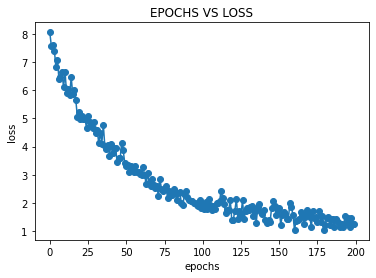

<Figure size 432x288 with 0 Axes>

In [83]:
# GRAPH FOR LOSS VS EPOCH
plt.plot(all_epochs,all_loss,marker='o')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.title('EPOCHS VS LOSS')

f = plt.figure()
plt.show()

### PREDICTION

In [84]:
if os.path.isdir('dataset/test'):
  # shutil.rmtree('dataset/test')
  pass
else:
  # !unzip dataset/images.zip -d dataset/
  with zipfile.ZipFile('dataset/test.zip', 'r') as zip_ref:
    zip_ref.extractall('dataset/')


In [85]:
test_data_multiple_dir = './dataset/test/images/multiple/' 
features = []

In [86]:
people = sorted(os.listdir(test_data_multiple_dir))
face_detector = dlib.get_frontal_face_detector()
features = []
dumpable_features = {}

In [87]:
model = SiameseNetwork(vggface)
checkpoint = tf.train.Checkpoint(model=model)
checkpoint.restore(checkpoint_path)

In [88]:
for person in people:
    person_path = os.path.join(test_data_multiple_dir, person)
    print(person_path)
    images = []
    for image in os.listdir(person_path):
        image_path = os.path.join(person_path, image)
        img = cv2.imread(image_path)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        faces = face_detector(gray, 0)
        if len(faces) == 1:
            for face in faces:
                face_bounding_box = face_utils.rect_to_bb(face)
                if all(i >= 0 for i in face_bounding_box):
                    [x, y, w, h] = face_bounding_box
                    frame = img[y:y + h, x:x + w]
                    frame = cv2.resize(frame, (256, 256))
                    frame = np.asarray(frame, dtype=np.float64)
                    images.append(frame)
    images = np.asarray(images)
    images = preprocess_input(images)
    images = tf.convert_to_tensor(images)
    feature = model.get_features(images)
    feature = tf.reduce_mean(feature, axis=0)
    features.append(feature.numpy())
    dumpable_features[person] = feature.numpy()

./dataset/test/images/multiple/client_009
./dataset/test/images/multiple/client_011
./dataset/test/images/multiple/client_019
./dataset/test/images/multiple/client_102
./dataset/test/images/multiple/client_117


In [89]:
features = np.asarray(features)

In [90]:
print(people)

['client_009', 'client_011', 'client_019', 'client_102', 'client_117']


In [91]:
def get_pred_single(path):
  img = cv2.imread(path)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  pred = 0

  faces = face_detector(gray, 0)
  for face in faces:
      face_bounding_box = face_utils.rect_to_bb(face)
      if all(i >= 0 for i in face_bounding_box):
          [x, y, w, h] = face_bounding_box
          frame = img[y:y + h, x:x + w]
          cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
          frame = cv2.resize(frame, (256, 256))
          frame = np.asarray(frame, dtype=np.float64)
          frame = np.expand_dims(frame, axis=0)
          frame = preprocess_input(frame)
          feature = model.get_features(frame)
              
          dist = tf.norm(features - feature, axis=1)
          loc = tf.argmin(dist)
          pred = dist[loc]
                  
  return pred

In [92]:
from os import walk
def get_labels_preds(file_path,thresh,refetch=False):
  f = []
  l = []
  p = []
  saved_preds_csv_path = os.path.join(file_path,'test_labels_preds_raw_lossless.csv')
  if refetch is True: 
    os.remove(saved_preds_csv_path)
  for (dirpath, dirnames, filenames) in walk(file_path):
      for file in filenames:
        if 'spoof' in file or 'attack' in file:
          l.append(1)
        elif 'real' in file:
          l.append(0)
        if not path.exists(saved_preds_csv_path) or (refetch == True):
          f_path = os.path.join(file_path,file)
          pred = get_pred_single(f_path)
          p.append(pred)
      f.extend(filenames)

  if not path.exists(saved_preds_csv_path):
    saved_preds_path_csv = saved_preds_csv_path
    labels = np.array(l)
    preds_raw = np.array(p)
    df = pd.DataFrame({"labels" : labels, "preds_raw" : preds_raw})
    df.to_csv(saved_preds_path_csv, index=False)
    print('data saved/re-written')
    for idx, val in enumerate(p):
      if val < thresh: # 0.8
        p[idx] = 0 # REAL
      else:
        p[idx] = 1 # SPOOF
  else:
    print('fetching from cached values')
    data_from_csv = pd.read_csv(saved_preds_csv_path)
    labels = data_from_csv['labels'].tolist()
    preds = data_from_csv['preds_raw'].tolist()
    for pred in preds:
      if pred < thresh: # 0.8
        pred_ = 0 # REAL
        p.append(pred_)
      else:
        pred_ = 1 # SPOOF
        p.append(pred_)

  return f,l,p

In [93]:
f,l,p = get_labels_preds('./dataset/test/images/single',0.8)
print(f)
print(l)
print(p)

data saved/re-written
['client_023_404_attack.png', 'client_009_real.png', 'client_011_real.png', 'client_011_spoof.png', 'client_019_spoof.png', 'client_102_spoof.png', 'client_009_spoof.png', 'client_117_real.png', 'client_023_404_real.png', 'client_019_real.png', 'client_117_spoof.png', 'client_102_real.png']
[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [94]:
def calculate_apcer(y_true, y_pred):
    true_spoof = 0  #### Spoof being 1
    false_real = 0  #### real being 0
    for i in range(len(y_true)):
        target = y_true[i]
        pred = y_pred[i]
        if target:
            true_spoof += 1
            if not pred:
                false_real += 1
    return false_real / true_spoof if true_spoof else 0

In [95]:
def calculate_bpcer(y_true, y_pred):
    true_real = 0  #### Spoof being 1
    false_spoof = 0  #### real being 0
    for i in range(len(y_true)):   
        target = y_true[i]
        pred = y_pred[i]
        if not target:
            true_real += 1
            if pred:
                false_spoof += 1
    return false_spoof / true_real if true_real else 0

In [96]:
def calculate_acer(apcer, bpcer):
  return (apcer + bpcer) / 2

In [97]:
def get_recall(matrix):
  TP = matrix[0][0]
  FN = matrix[1][0]
  print(TP)
  recall = TP / (TP + FN)
  return recall

In [98]:
def get_precesion(matrix):
  TP = matrix[0][0]
  FP = matrix[0][1]
  precesion = TP / (TP + FP)
  return precesion

In [99]:
def get_F1_score(recall,precision):
  F1_score = 2*recall*precision / (recall + precision)
  return F1_score

In [100]:
def get_acccuracy(matrix , total_classes):
  TP = matrix[0][0]
  TN = matrix[1][1]
  return (TP + TN) / total_classes


In [101]:
def get_thresh_list(start,end,step):
  return np.arange(start,end,step)

In [102]:
thresh = get_thresh_list(0,1.05,0.05)
all_thresh_labels_preds_test = []
for t in thresh:
  f,l,p = get_labels_preds('./dataset/test/images/single',t)
      
  all_thresh_labels_preds_test.append({ 'thresh': t, 'preds': p, 'labels':l })

fetching from cached values
fetching from cached values
fetching from cached values
fetching from cached values
fetching from cached values
fetching from cached values
fetching from cached values
fetching from cached values
fetching from cached values
fetching from cached values
fetching from cached values
fetching from cached values
fetching from cached values
fetching from cached values
fetching from cached values
fetching from cached values
fetching from cached values
fetching from cached values
fetching from cached values
fetching from cached values
fetching from cached values


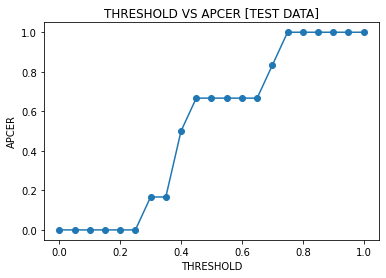

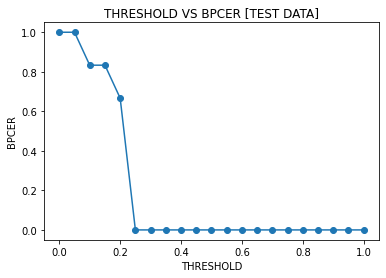

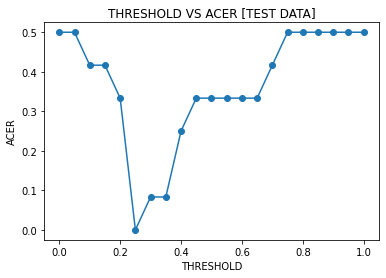

In [103]:
x_thresh_data = []
y_apcer_data = []
y_bpcer_data = []
y_acer_data = []
for t_l_p in all_thresh_labels_preds_test:
  x_thresh_data.append(t_l_p['thresh'])
  apcer = calculate_apcer(t_l_p['labels'],t_l_p['preds'])
  bpcer = calculate_bpcer(t_l_p['labels'],t_l_p['preds'])
  acer = calculate_acer(apcer,bpcer)
  y_apcer_data.append(apcer)
  y_bpcer_data.append(bpcer)
  y_acer_data.append(acer)

# GRAPH FOR THRESHOLD VS APCER [TEST DATA]
plt.plot(x_thresh_data,y_apcer_data,marker='o')
plt.ylabel('APCER')
plt.xlabel('THRESHOLD')
plt.title('THRESHOLD VS APCER [TEST DATA]')
plt.show()

# GRAPH FOR THRESHOLD VS BPCER [TEST DATA]
plt.plot(x_thresh_data,y_bpcer_data,marker='o')
plt.ylabel('BPCER')
plt.xlabel('THRESHOLD')
plt.title('THRESHOLD VS BPCER [TEST DATA]')
plt.show()

# GRAPH FOR THRESHOLD VS ACER [TEST DATA]
plt.plot(x_thresh_data,y_acer_data,marker='o')
plt.ylabel('ACER')
plt.xlabel('THRESHOLD')
plt.title('THRESHOLD VS ACER [TEST DATA]')
plt.show()


In [104]:
data = []
for t_l_p in all_thresh_labels_preds_test:
  # print('For threshold -',t_l_p['thresh'],'confusion_matrix is \n')
  # print(t_l_p['labels'])
  # print(tf.math.confusion_matrix(t_l_p['labels'],t_l_p['preds']))
  matrix = tf.math.confusion_matrix(t_l_p['labels'],t_l_p['preds'])
  matrix_str = str(matrix).split('tf.Tensor(')[1].split(',')[0]
  recall = get_recall(matrix)
  recall_str = str(recall).split('tf.Tensor(')[1].split(',')[0] 
  # print('recall - ',recall)
  precision = get_precesion(matrix)
  precision_str = str(precision).split('tf.Tensor(')[1].split(',')[0] 
  # print('precision - ',precision)
  F1_score = get_F1_score(recall,precision)
  F1_score = str(F1_score).split('tf.Tensor(')[1].split(',')[0] 
  # print('F1 score - ',F1_score)
  accuracy = get_acccuracy(matrix, len(t_l_p['labels']))
  accuracy = str(accuracy).split('tf.Tensor(')[1].split(',')[0] 
  # print('accuracy - ',accuracy)
  data.append({ 'matrix': matrix_str, 'thresh': t_l_p['thresh'] , 'recall':recall_str,'precision':precision_str , 'f1_score':F1_score , 'accuracy':accuracy})
  # print('\n')

keys = []
vals = []
for data in data:
    val = []
    for k,v in data.items():
        keys.append(k)
        val.append(v)
    vals.append(val)

pd.DataFrame([v for v in vals], columns=list(dict.fromkeys(keys)))

tf.Tensor(0, shape=(), dtype=int32)
tf.Tensor(0, shape=(), dtype=int32)
tf.Tensor(1, shape=(), dtype=int32)
tf.Tensor(1, shape=(), dtype=int32)
tf.Tensor(2, shape=(), dtype=int32)
tf.Tensor(6, shape=(), dtype=int32)
tf.Tensor(6, shape=(), dtype=int32)
tf.Tensor(6, shape=(), dtype=int32)
tf.Tensor(6, shape=(), dtype=int32)
tf.Tensor(6, shape=(), dtype=int32)
tf.Tensor(6, shape=(), dtype=int32)
tf.Tensor(6, shape=(), dtype=int32)
tf.Tensor(6, shape=(), dtype=int32)
tf.Tensor(6, shape=(), dtype=int32)
tf.Tensor(6, shape=(), dtype=int32)
tf.Tensor(6, shape=(), dtype=int32)
tf.Tensor(6, shape=(), dtype=int32)
tf.Tensor(6, shape=(), dtype=int32)
tf.Tensor(6, shape=(), dtype=int32)
tf.Tensor(6, shape=(), dtype=int32)
tf.Tensor(6, shape=(), dtype=int32)


,matrix,thresh,recall,precision,f1_score,accuracy
0,\n[[0 6]\n [0 6]],0.00,nan,0.0,nan,0.5
1,\n[[0 6]\n [0 6]],0.05,nan,0.0,nan,0.5
2,\n[[1 5]\n [0 6]],0.10,1.0,0.16666666666666666,0.2857142857142857,0.5833333333333334
3,\n[[1 5]\n [0 6]],0.15,1.0,0.16666666666666666,0.2857142857142857,0.5833333333333334
4,\n[[2 4]\n [0 6]],0.20,1.0,0.3333333333333333,0.5,0.6666666666666666
5,\n[[6 0]\n [0 6]],0.25,1.0,1.0,1.0,1.0
6,\n[[6 0]\n [1 5]],0.30,0.8571428571428571,1.0,0.923076923076923,0.9166666666666666
7,\n[[6 0]\n [1 5]],0.35,0.8571428571428571,1.0,0.923076923076923,0.9166666666666666
8,\n[[6 0]\n [3 3]],0.40,0.6666666666666666,1.0,0.8,0.75
9,\n[[6 0]\n [4 2]],0.45,0.6,1.0,0.7499999999999999,0.6666666666666666


In [ ]:
def is_image_recognized(path):
  name = 'SPOOF'
  img = cv2.imread(path)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  faces = face_detector(gray, 0)
  for face in faces:
      face_bounding_box = face_utils.rect_to_bb(face)
      if all(i >= 0 for i in face_bounding_box):
          [x, y, w, h] = face_bounding_box
          frame = img[y:y + h, x:x + w]
          cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
          frame = cv2.resize(frame, (256, 256))
          frame = np.asarray(frame, dtype=np.float64)
          frame = np.expand_dims(frame, axis=0)
          frame = preprocess_input(frame)
          feature = model.get_features(frame)
              
          dist = tf.norm(features - feature, axis=1)
          name = 'SPOOF'
          loc = tf.argmin(dist)
          if dist[loc] < 0.25:
              name = f'{people[loc]}-REAL--{dist[loc]}'
          else:
              # print(dist.numpy())
              name = f'{people[loc]}-SPOOF--{dist[loc]}'
                  
          font_face = cv2.FONT_HERSHEY_SIMPLEX
          cv2.putText(img, name, (x, y-5), font_face, 0.8, (0,0,255), 3)
  cv2_imshow(img)
  return True

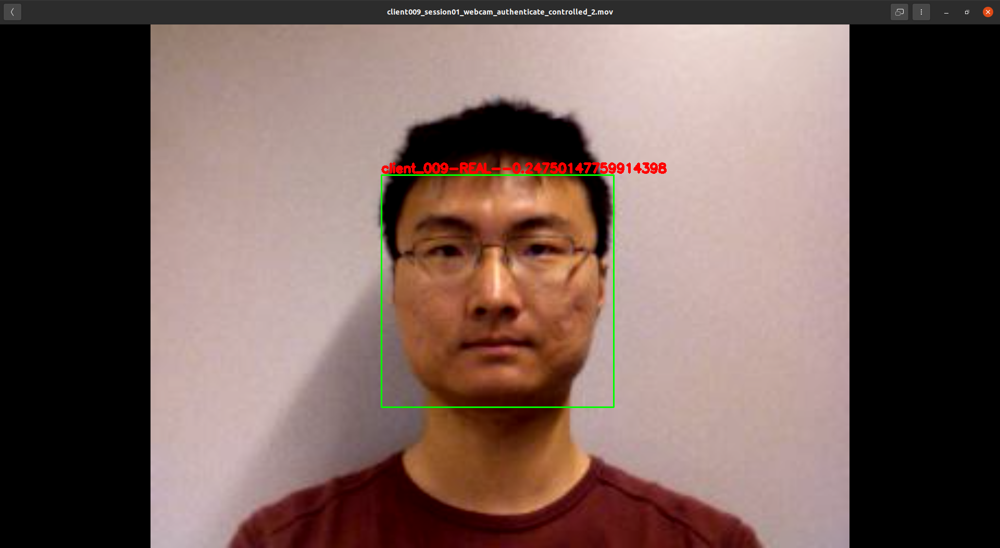

True


In [ ]:
is_rec = is_image_recognized('./dataset/test/images/single/client_009_real.png')
print(is_rec)

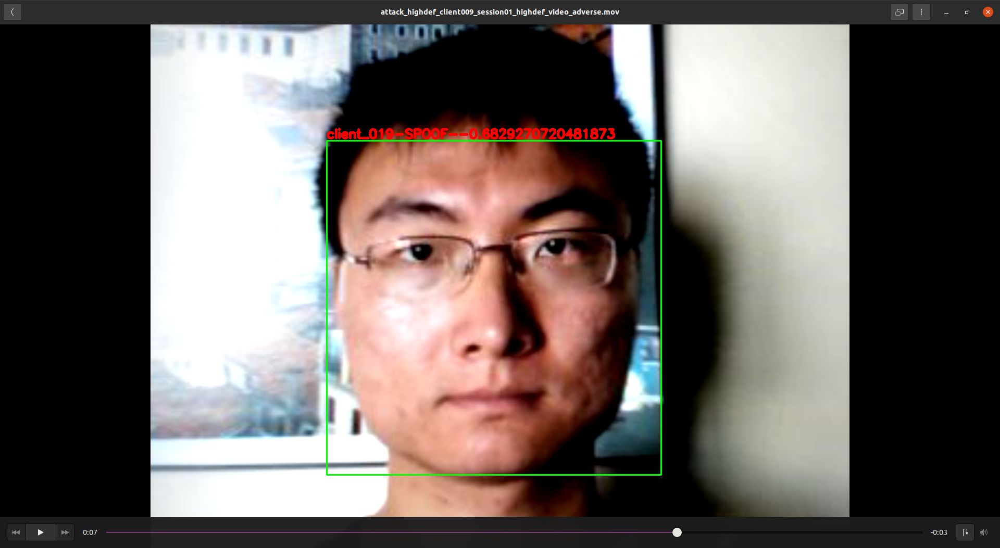

True


In [ ]:
is_rec = is_image_recognized('./dataset/test/images/single/client_009_spoof.png')
print(is_rec)

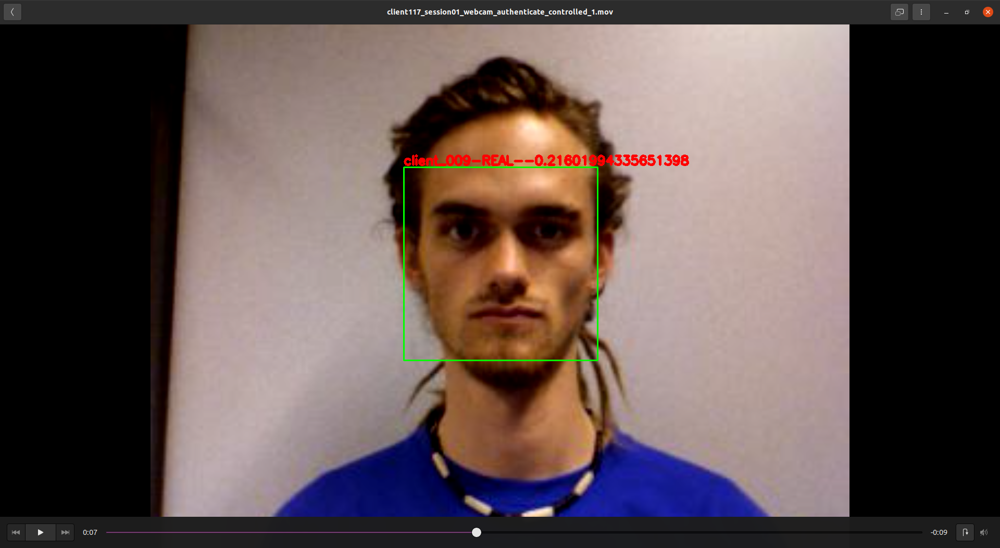

True


In [ ]:
is_rec = is_image_recognized('./dataset/test/images/single/client_117_real.png')
print(is_rec)

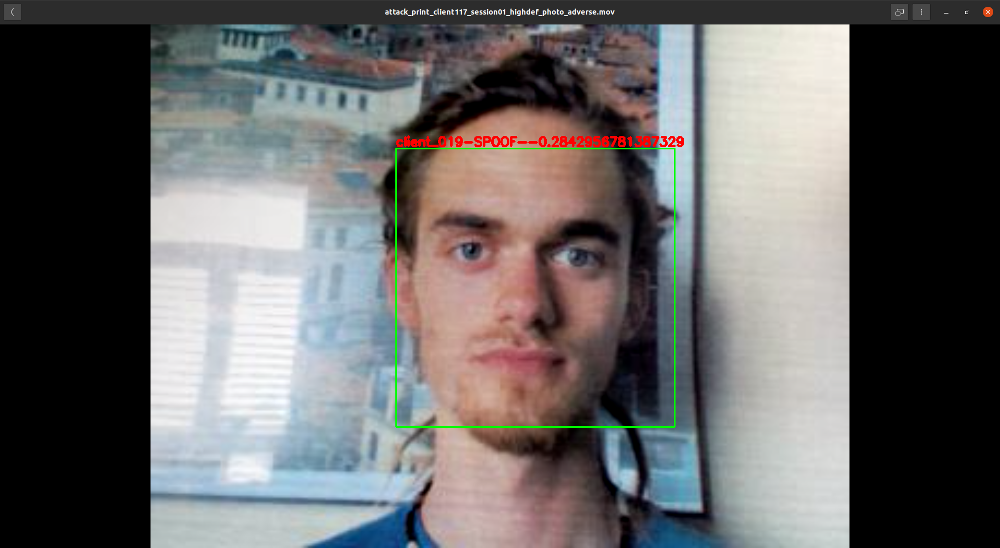

True


In [ ]:
is_rec = is_image_recognized('./dataset/test/images/single/client_117_spoof.png')
print(is_rec)

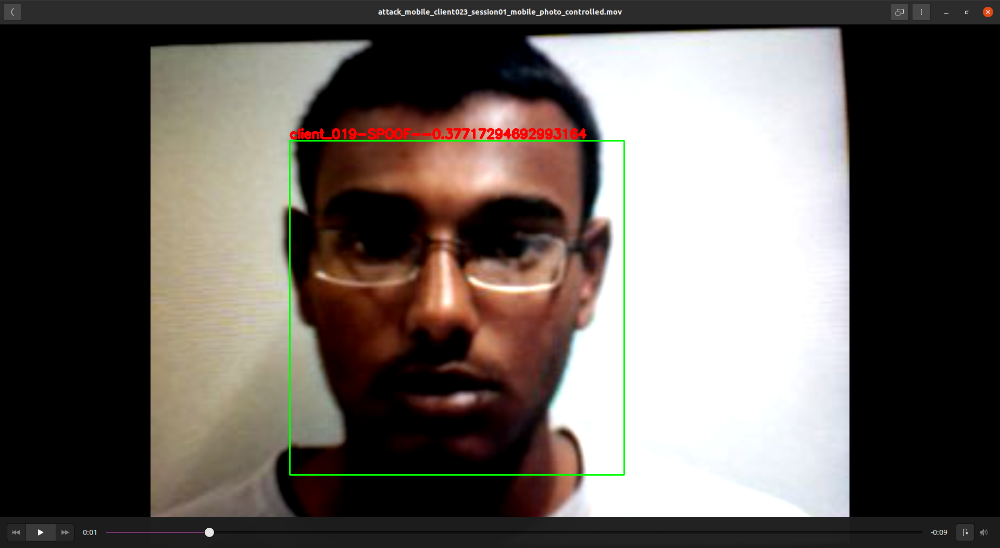

True


In [ ]:
is_rec = is_image_recognized('./dataset/test/images/single/client_023_404_attack.png')
print(is_rec)

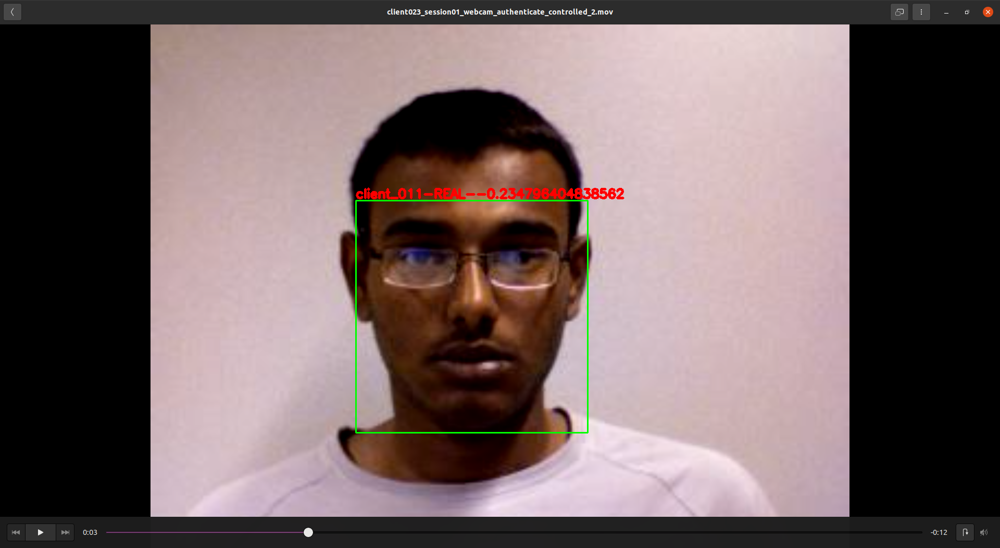

True


In [ ]:
is_rec = is_image_recognized('./dataset/test/images/single/client_023_404_real.png')
print(is_rec)